In [ ]:
pip install netCDF4

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.2/5.2 MB 49.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 68.5 MB/s eta 0:00:00


In [ ]:
import netCDF4 as nc

In [ ]:
fe = '/content/drive/MyDrive/CERTIFICATES/RF_100.nc'
fh = nc.Dataset(fe)

f2018 = '/content/drive/MyDrive/RF25_IMD0p252018.nc'
#fh2018 = nc.Dataset(f2018)
f2019 = '/content/drive/MyDrive/RF25_IMD0p252019.nc'
fh2019 = nc.Dataset(f2019)
f2020 = '/content/drive/MyDrive/CERTIFICATES/RF25_IMD0p252020.nc'
fh2020 = nc.Dataset(f2020)

In [ ]:
import numpy as np
import numpy.ma as ma

In [ ]:
import matplotlib.pyplot as plt

In [ ]:
lons = fh.variables['longitude'][:]
lats = fh.variables['latitude'][:]
time = fh.variables['time'][:]
rain = fh.variables['rf'][:]

#rain2018 = fh2018.variables['RAINFALL'][:]
rain2019 = fh2019.variables['RAINFALL'][:]
rain2020 = fh2020.variables['RAINFALL'][:]

In [ ]:
longitude = lons.data
latitude = lats.data

**Characteristics of Single grid**


In [ ]:
import numpy as np 

def rollingMeanRainfall_func_1(a,b,y,x) :
  lon_idx = np.abs(lons - x).argmin()
  lat_idx = np.abs(lats - y).argmin()
  rainfall_at_loc = rain[a:b,:, lat_idx, lon_idx]
  arr = rainfall_at_loc.reshape(b-a)
  avg=[]
  i = 0
  k=3
  while i < len(arr) - k:
      window_average = np.sum(arr[i:i+k]) / k
      avg.append(window_average)
      i += 1

  m = np.mean(avg)
  p=np.std(avg)
  thr=m+4*p
  mean_every_year = []
  std_every_year = []
  ratio_every_year = []
  extreme_ratio = []
  idx = np.where(arr > thr)[0]
  extremum = arr[idx]

  for i in range(int(len(avg)/365)):
    start = i*365 + 1  
    end = (i+1)*365  
    new_array = extremum[np.where((idx >= start) & (idx <= end))[0]]  
    sum_ex = np.sum(new_array)
    base_arr = avg[i*365+160:i*365+280]
    base_arr1 = avg[i*365:(i+1)*365]
    sum = np.sum(base_arr1)
    me = np.mean(base_arr)
    ratio = sum_ex/sum
    extreme_ratio.append(ratio)
    st = np.std(base_arr)
    ratio_every_year.append(sum)
    mean_every_year.append(me)
    std_every_year.append(st)

  base_arr2019=rain2019[180:280]
  me2019= np.mean(base_arr2019)
  st2019= np.std(base_arr2019)
  mean_every_year.append(me2019)
  std_every_year.append(st2019)

  base_arr2020=rain2020[180:280]
  me2020= np.mean(base_arr2020)
  st2020= np.std(base_arr2020)
  mean_every_year.append(me2020)
  std_every_year.append(st2020)

  plt.plot(avg,marker='.')
  plt.gcf().set_size_inches(17, 6) 
  plt.xticks(np.arange(0, 40000, 2000))
  plt.title('Rolling mean of rainfall')
  plt.show()
  print("")
  plt.plot(extremum,marker='.')
  plt.gcf().set_size_inches(17, 6) 
  plt.xticks(np.arange(0, 1100, 100))
  plt.title('Rainfall values exceeding threshold FROM 1901-2017')
  plt.show()
  print("")
  plt.plot(mean_every_year,marker='o')
  plt.axhline(y=np.mean(mean_every_year))
  plt.gcf().set_size_inches(17, 6) 
  plt.xticks(np.arange(0, 120, 5))
  plt.title('MEAN RAINFALL PER DAY IN MONSOON FROM 1901-2017')
  plt.show()
  print("")
  plt.plot(extreme_ratio,marker='o')
  plt.axhline(y=np.mean(extreme_ratio))
  plt.gcf().set_size_inches(17, 6) 
  plt.xticks(np.arange(0, 120, 5))
  plt.title('EXTREME RAINFALL BY TOTAL RAINFALL RATIO PER YEAR IN MONSOON FROM 1901-2017')
  plt.show()
  print("")
  plt.plot(std_every_year,marker='o')
  plt.gcf().set_size_inches(17, 6) 
  plt.xticks(np.arange(0, 120, 5))
  plt.title('std year')
  plt.show()
  print("")


Dharwad

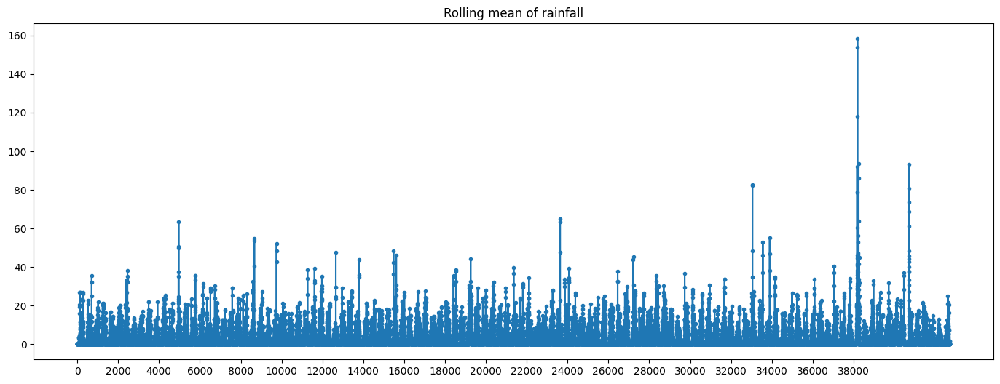

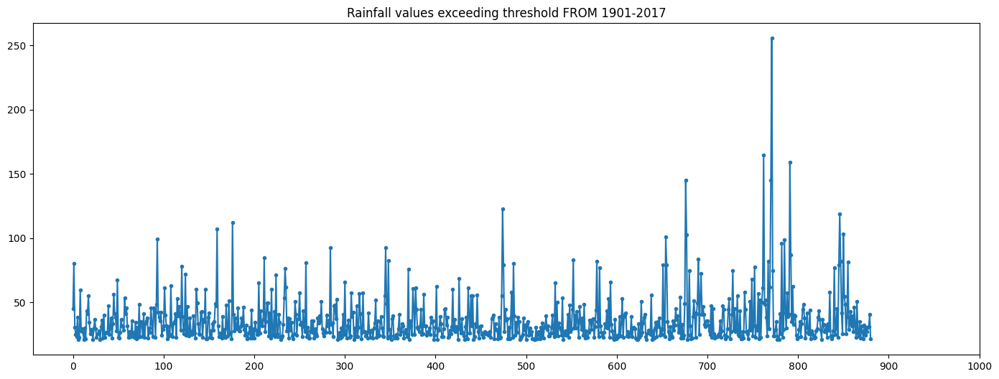

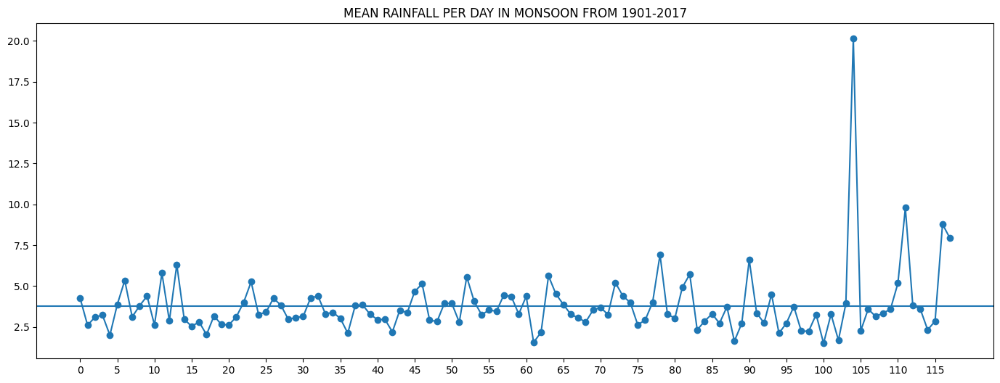

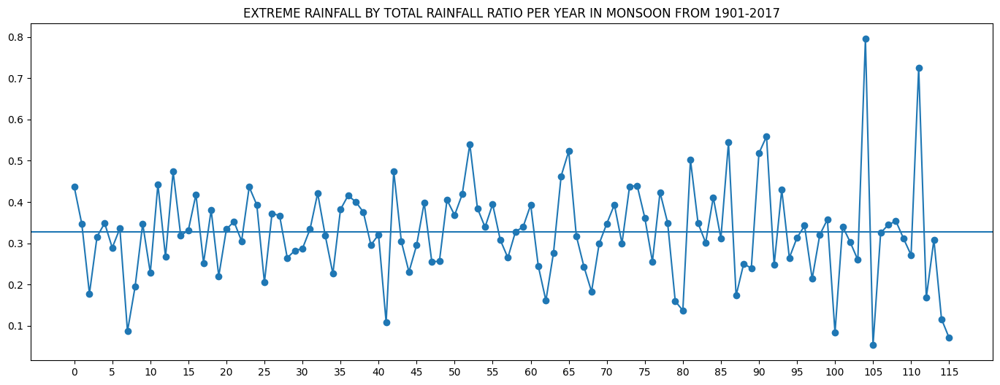

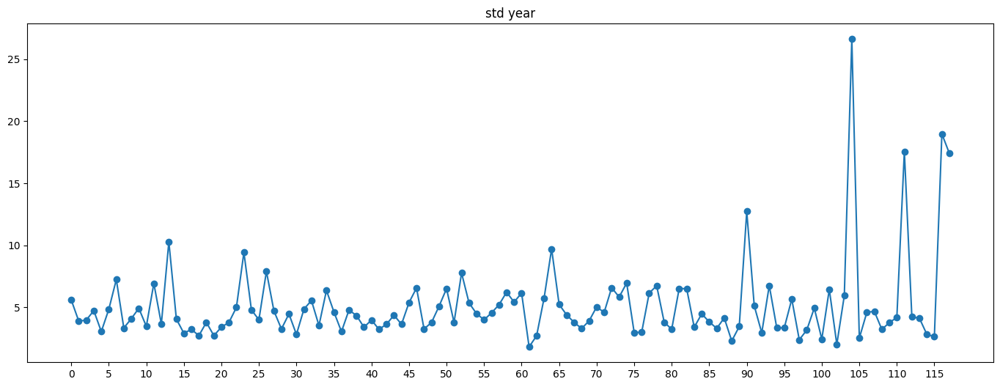

In [ ]:
rollingMeanRainfall_func_1(0*365,117*365,15.26,75.07)

Raichur

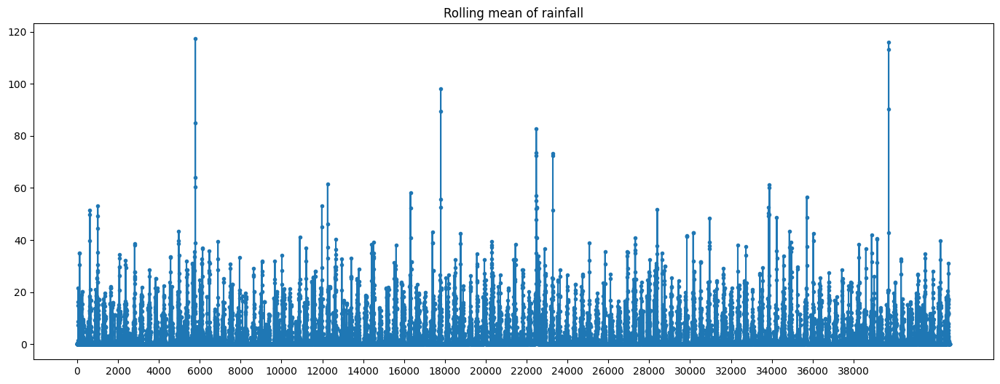

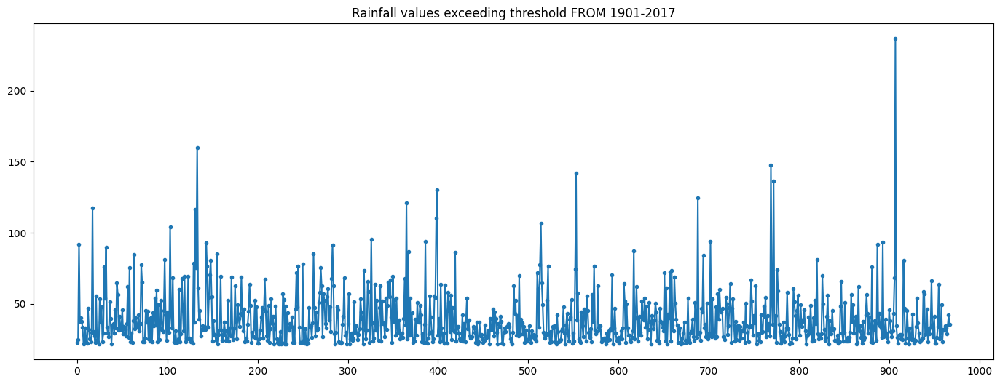

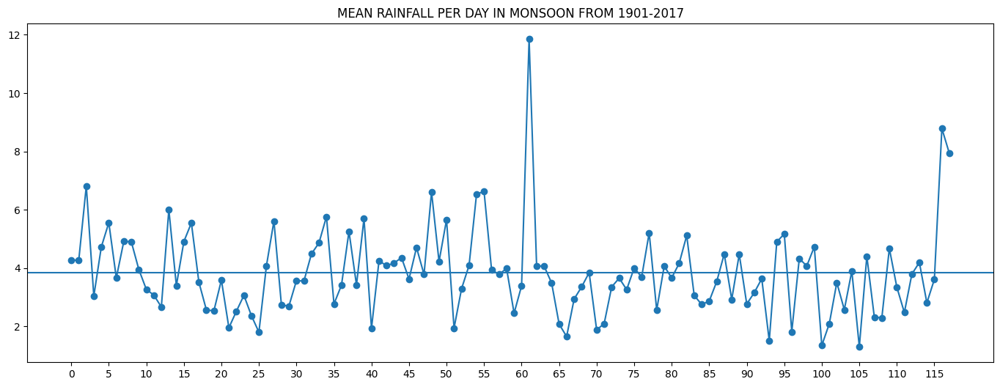

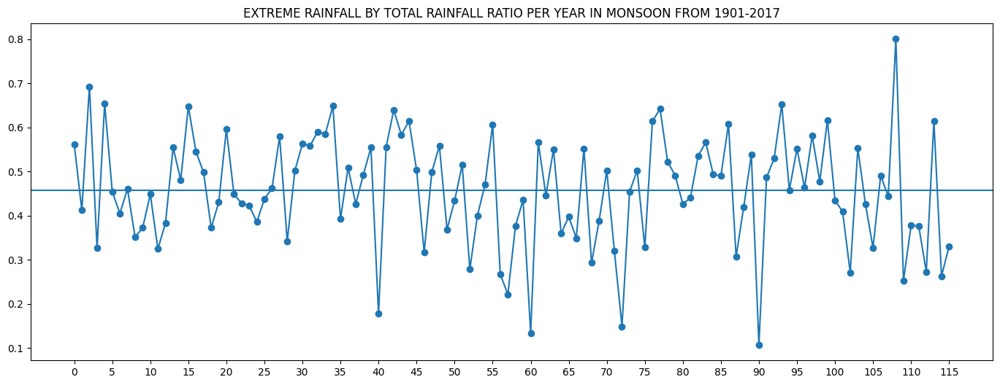

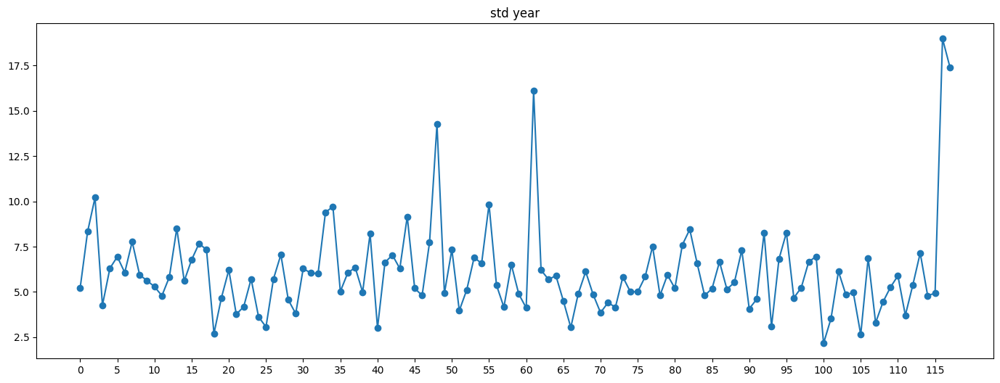

In [ ]:
rollingMeanRainfall_func_1(0*365,117*365,16.21,77.37)

Delhi

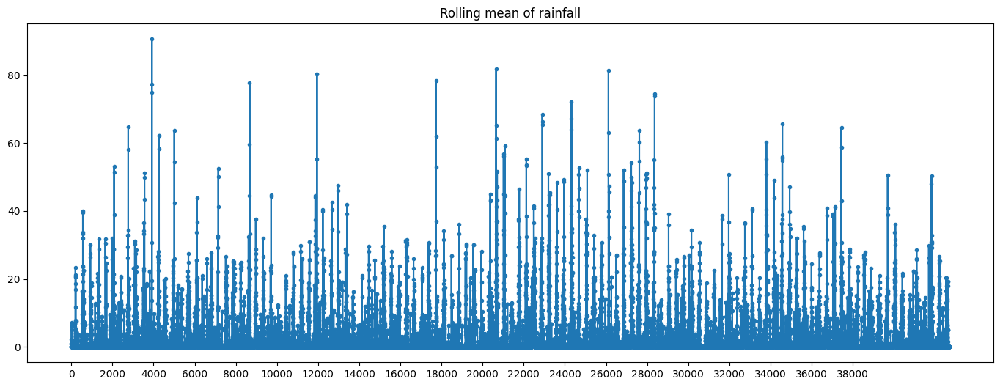

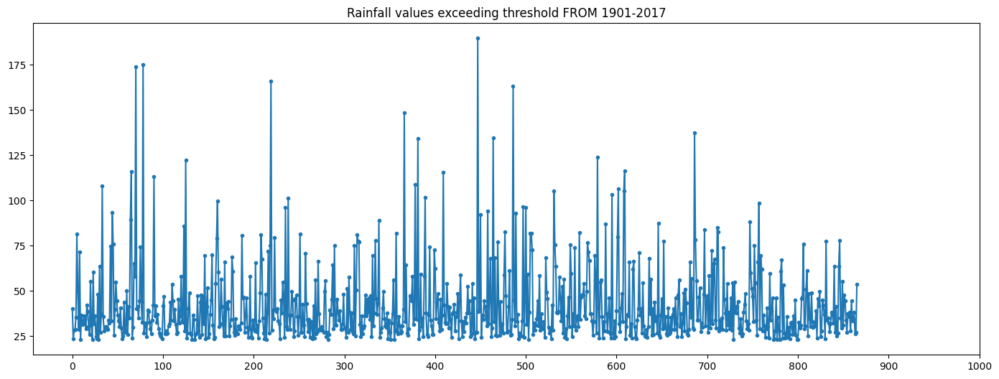

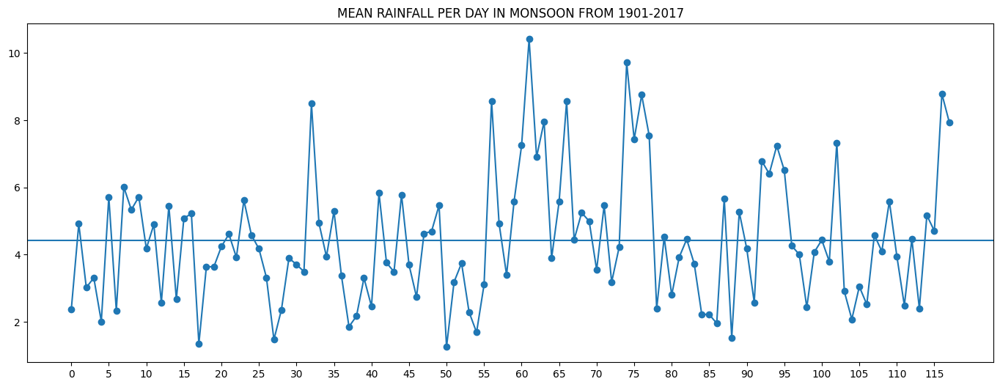

/usr/local/lib/python3.10/dist-packages/numpy/core/shape_base.py:65: UserWarning: Warning: converting a masked element to nan.
  ary = asanyarray(ary)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:163: UserWarning: Warning: converting a masked element to nan.
  arr = asanyarray(a)


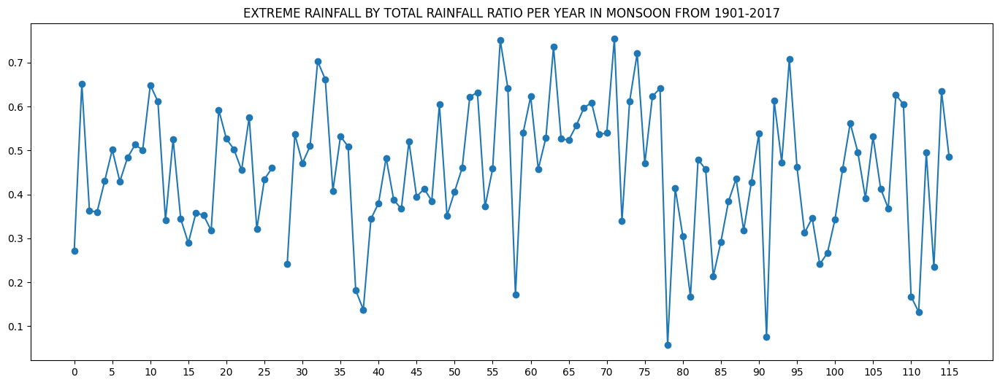

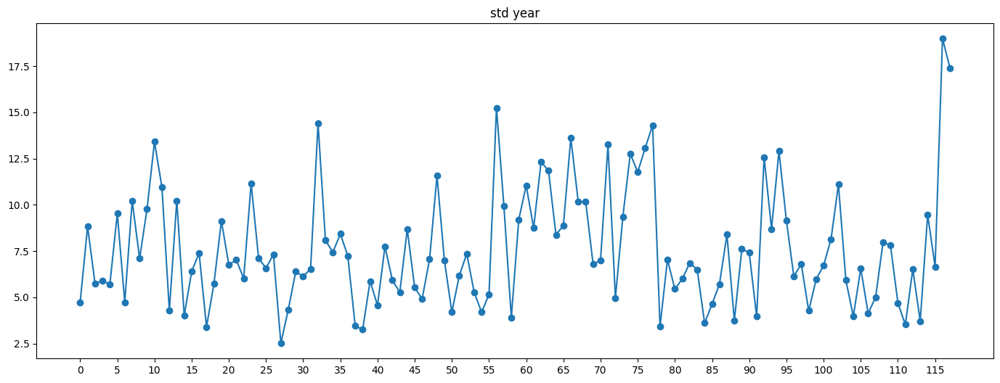

In [ ]:
rollingMeanRainfall_func_1(0*365,117*365,28.70,77.10)

Chirapunjee

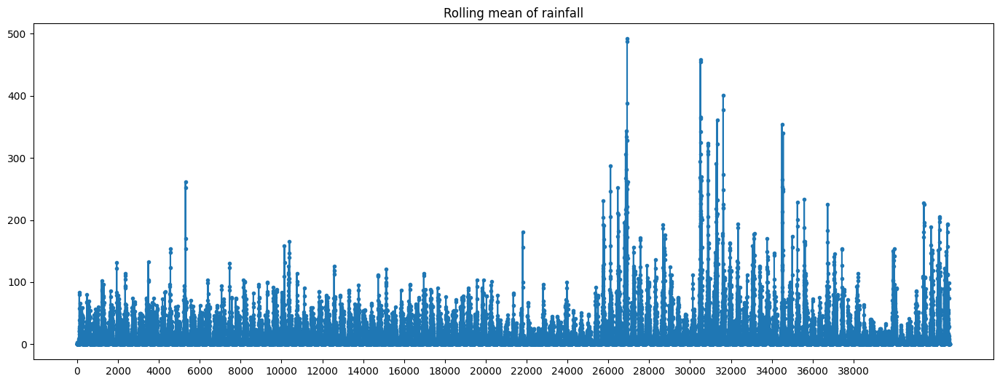

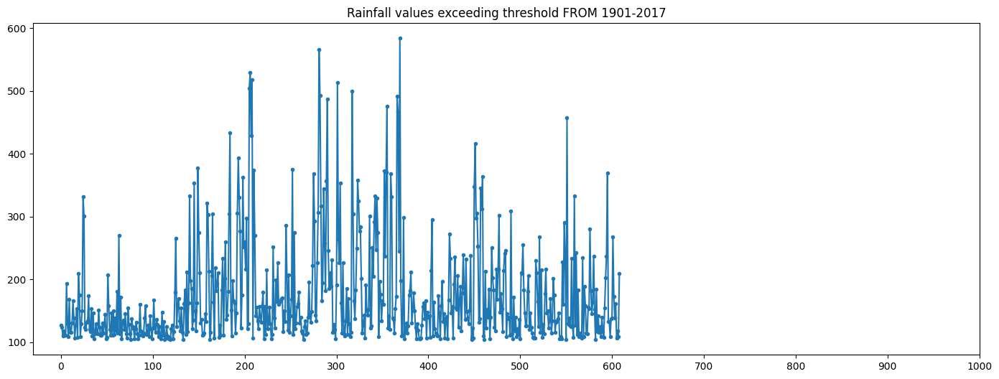

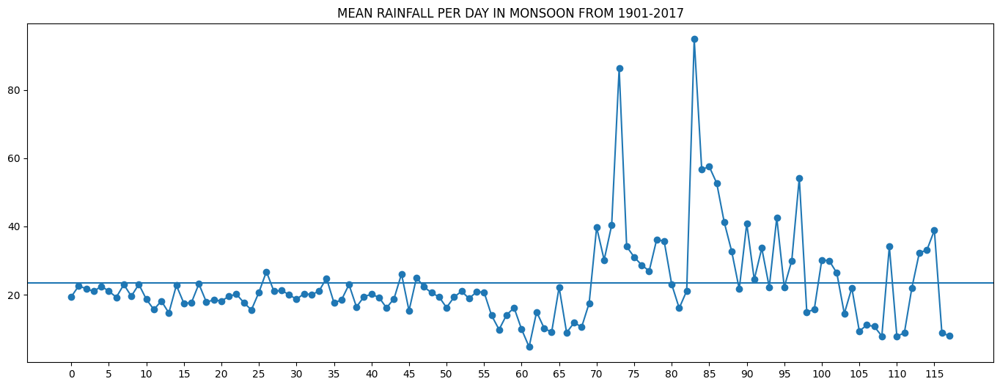

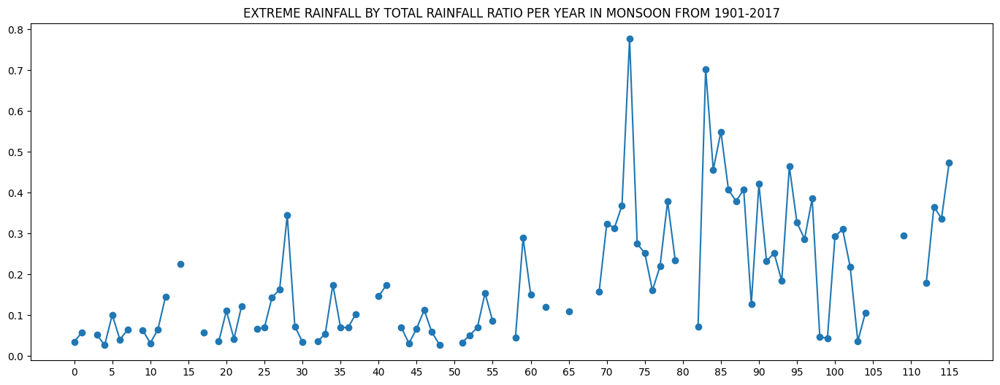

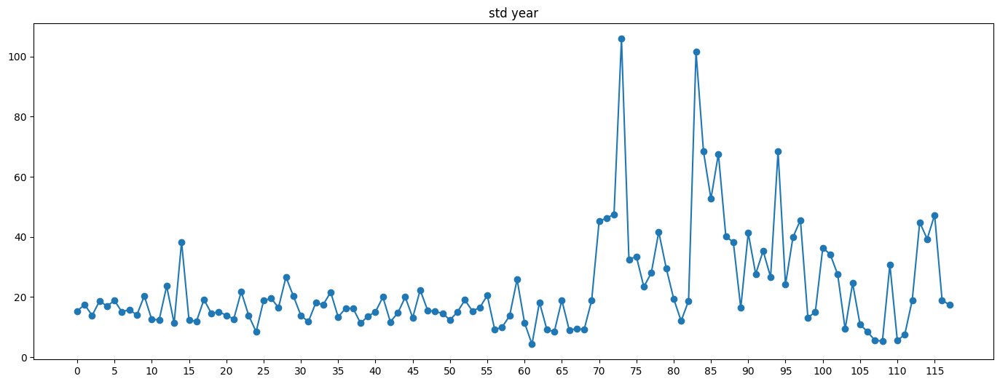

In [ ]:
rollingMeanRainfall_func_1(0*365,117*365,25.27,91.73)

Bangalore

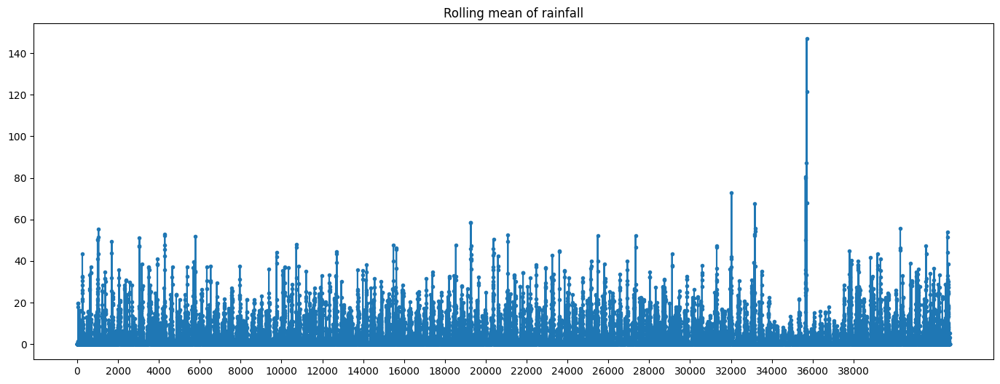

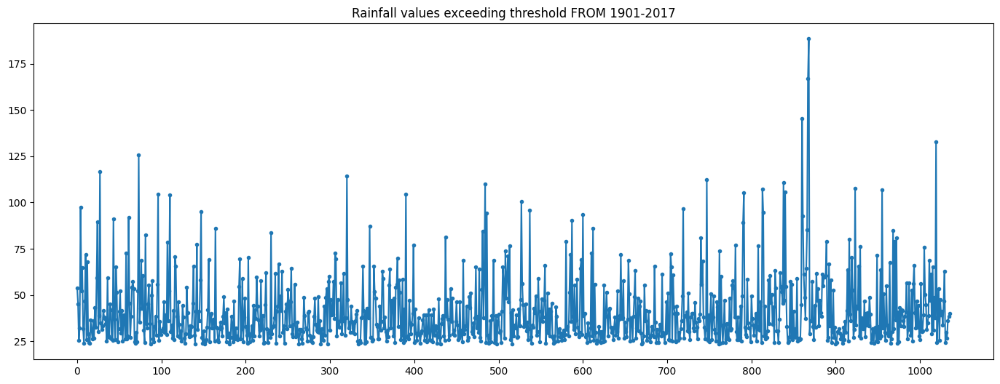

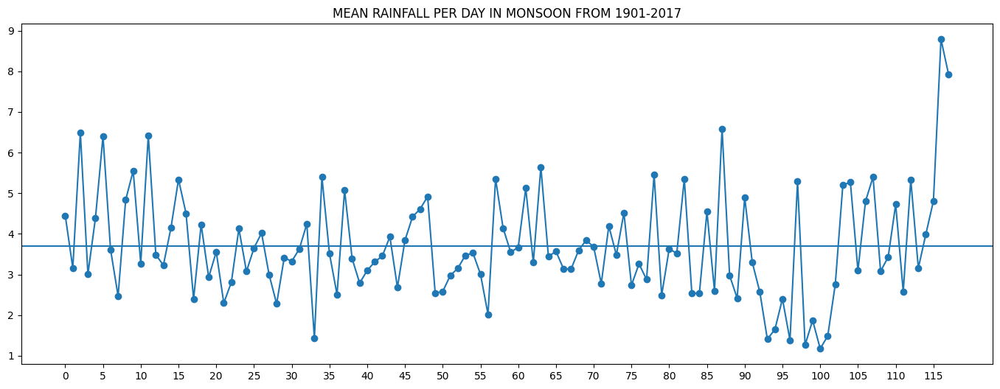

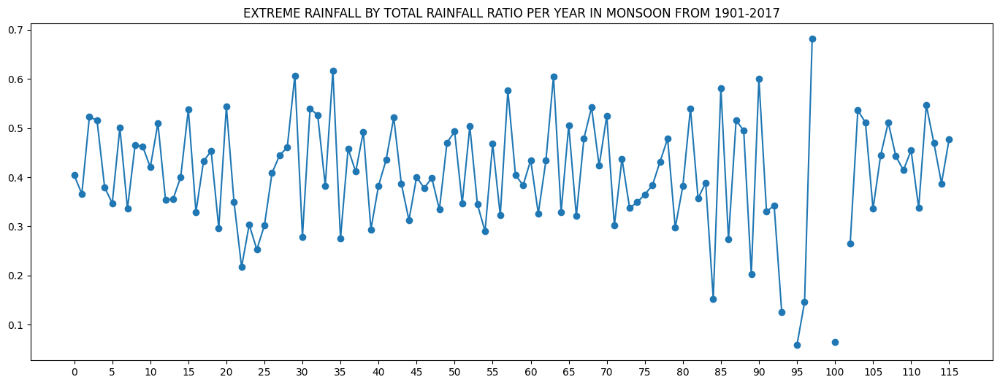

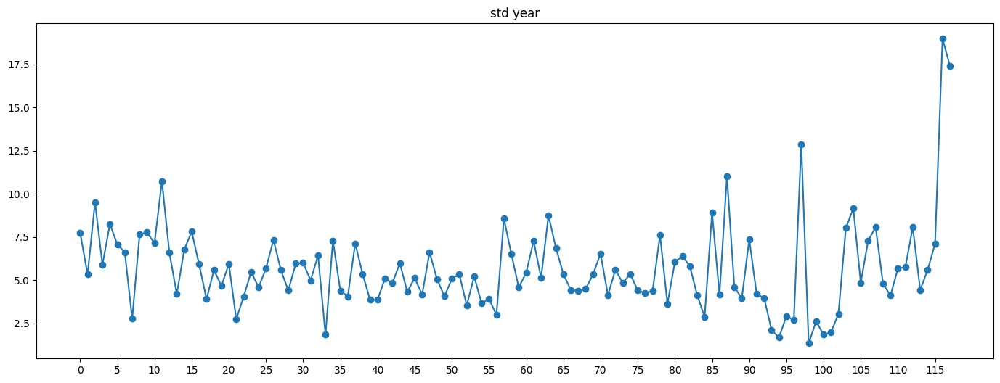

In [ ]:
rollingMeanRainfall_func_1(0*365,117*365,12.97,77.59)

# Finding Extemum Ratio


In [ ]:
import numpy as np 
import matplotlib.pyplot as plt

def extremum_ratio(a,b,y,x) :
    lon_idx = np.abs(lons - x).argmin()
    lat_idx = np.abs(lats - y).argmin()
    rainfall_at_loc = rain[a:b,:, lat_idx, lon_idx]
    arr = rainfall_at_loc.reshape(b-a)
    avg=[]
    i = 0
    k=4
    while i < len(arr) - k:
        window_average = np.sum(arr[i:i+k]) / k
        avg.append(window_average)
        i += 1

    m = np.mean(avg)
    p=np.std(avg)
    thr=m+4*p
    mean_every_year = []
    std_every_year = []
    ratio_every_year = []
    extreme_ratio = []
    idx = np.where(arr > thr)[0]
    extremum = arr[idx]

    for i in range(int(len(avg)/365)):
        start = i*365 + 1  
        end = (i+1)*365  
        new_array = extremum[np.where((idx >= start) & (idx <= end))[0]]  
        sum_ex = np.sum(new_array)
        base_arr = avg[i*365+160:i*365+280]
        base_arr1 = avg[i*365:(i+1)*365]
        sum = np.sum(base_arr1)
        me = np.mean(base_arr)
        ratio = sum_ex/sum
        extreme_ratio.append(ratio)
        st = np.std(base_arr)
        ratio_every_year.append(sum)
        mean_every_year.append(me)
        std_every_year.append(st)

    base_arr2019=rain2019[170:280]
    me2019= np.mean(base_arr2019)
    st2019= np.std(base_arr2019)
    mean_every_year.append(me2019)
    std_every_year.append(st2019)

    base_arr2020=rain2020[170:280]
    me2020= np.mean(base_arr2020)
    st2020= np.std(base_arr2020)
    mean_every_year.append(me2020)
    std_every_year.append(st2020)

    return mean_every_year, std_every_year, extreme_ratio


PLOT OF EXTREMUM/TOTAL RAINFALL OF 5 GRIDS

In [ ]:
# Example comparison of 5 different grids

def rainfall_5_grids(a,b,x,y) :
  grid1 = extremum_ratio(a,b,x,y-0.25)
  grid2 = extremum_ratio(a,b,x,y-0.5)
  grid3 = extremum_ratio(a,b,x,y-0.75)
  grid4 = extremum_ratio(a,b,x,y-1)
  grid5 = extremum_ratio(a,b,x,y-1.5)

  fig, axs = plt.subplots(3, figsize=(15,15))
  axs[0].plot(grid1[0],marker='.', label='Grid 1')
  axs[0].plot(grid2[0],marker='.', label='Grid 2')
  axs[0].plot(grid3[0],marker='.', label='Grid 3')
  axs[0].plot(grid4[0],marker='.', label='Grid 4')
  axs[0].plot(grid5[0],marker='.', label='Grid 5')
  axs[0].set_title('Mean rainfall per day in monsoon from 1901-2017')
  axs[0].legend()
  print("")

  axs[1].plot(grid1[1],marker='.', label='Grid 1')
  axs[1].plot(grid2[1],marker='.', label='Grid 2')
  axs[1].plot(grid3[1],marker='.', label='Grid 3')
  axs[1].plot(grid4[1],marker='.', label='Grid 4')
  axs[1].plot(grid5[1],marker='.', label='Grid 5')
  axs[1].set_title('Std deviation per day in monsoon from 1901-2017')
  axs[1].legend()
  print("")

  axs[2].plot(grid1[2],marker='.', label='Grid 1')
  axs[2].plot(grid2[2],marker='.', label='Grid 2')
  axs[2].plot(grid3[2],marker='.', label='Grid 3')
  axs[2].plot(grid4[2],marker='.', label='Grid 4')
  axs[2].plot(grid5[2],marker='.', label='Grid 5')
  axs[2].set_title('Extreme ratio per day in monsoon from 1901-2017')
  axs[2].legend()

# **STUDY ON COAL PLANTS**
1.   RAICHUR commision 1986
2.   SASAN commision 2015
4. SIPAT commision 2008
5. RAMAGUNDAM commision 1983

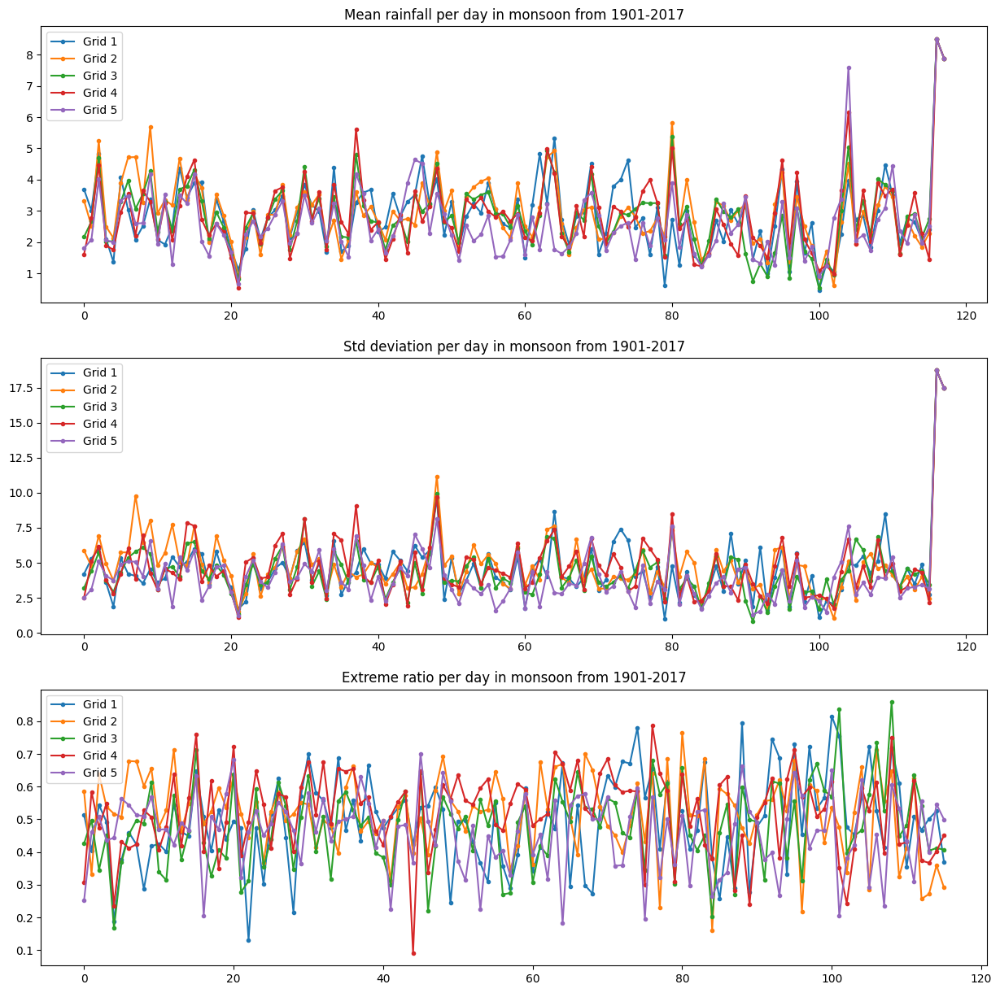

In [ ]:
rainfall_5_grids(0*365,117*365,16.25,76.5)

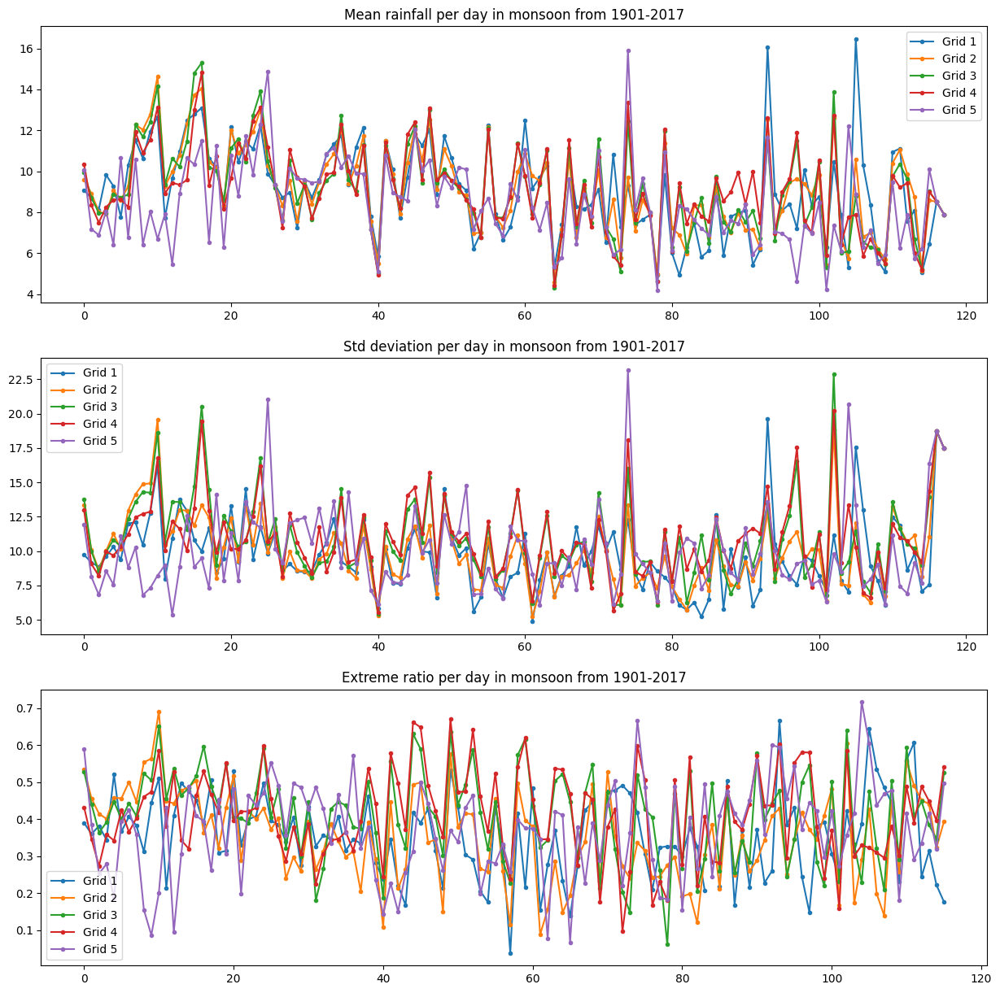

In [ ]:
rainfall_5_grids(0*365,117*365,23.75,82.5)

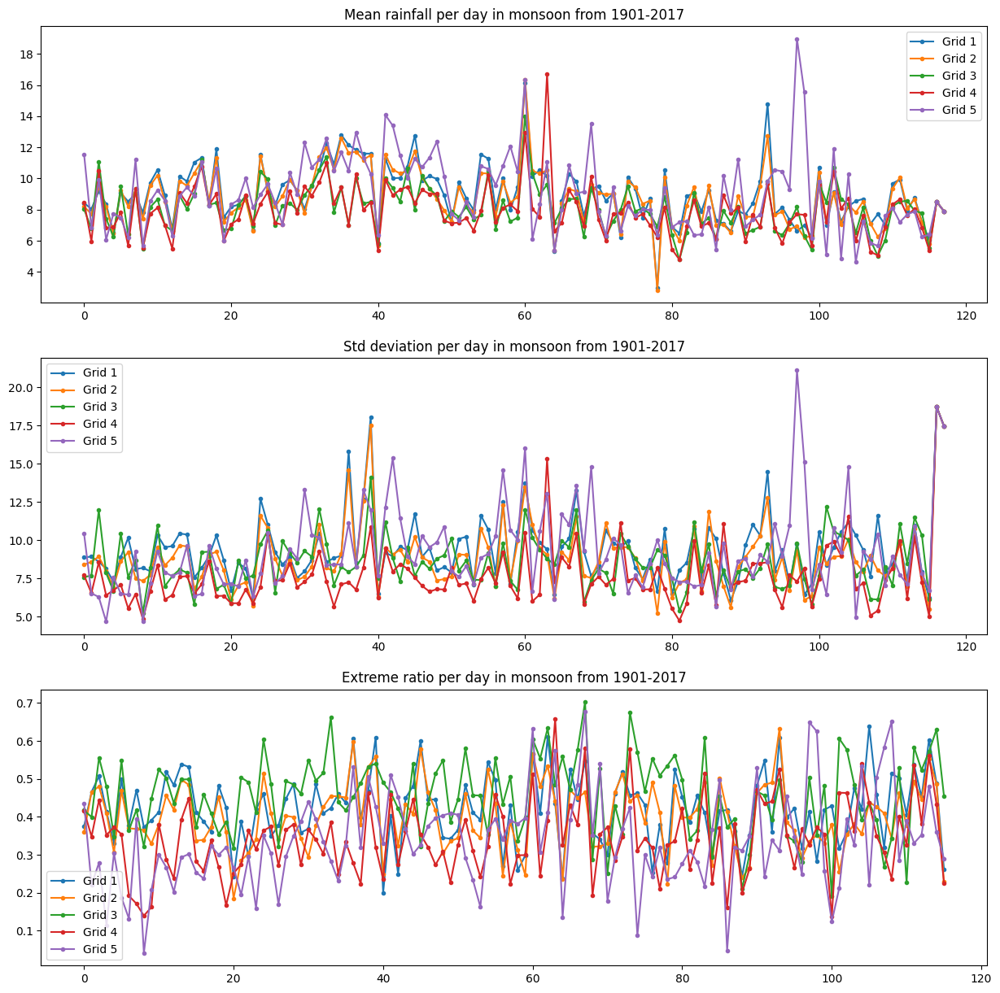

In [ ]:
rainfall_5_grids(0*365,117*365,22,82.25)

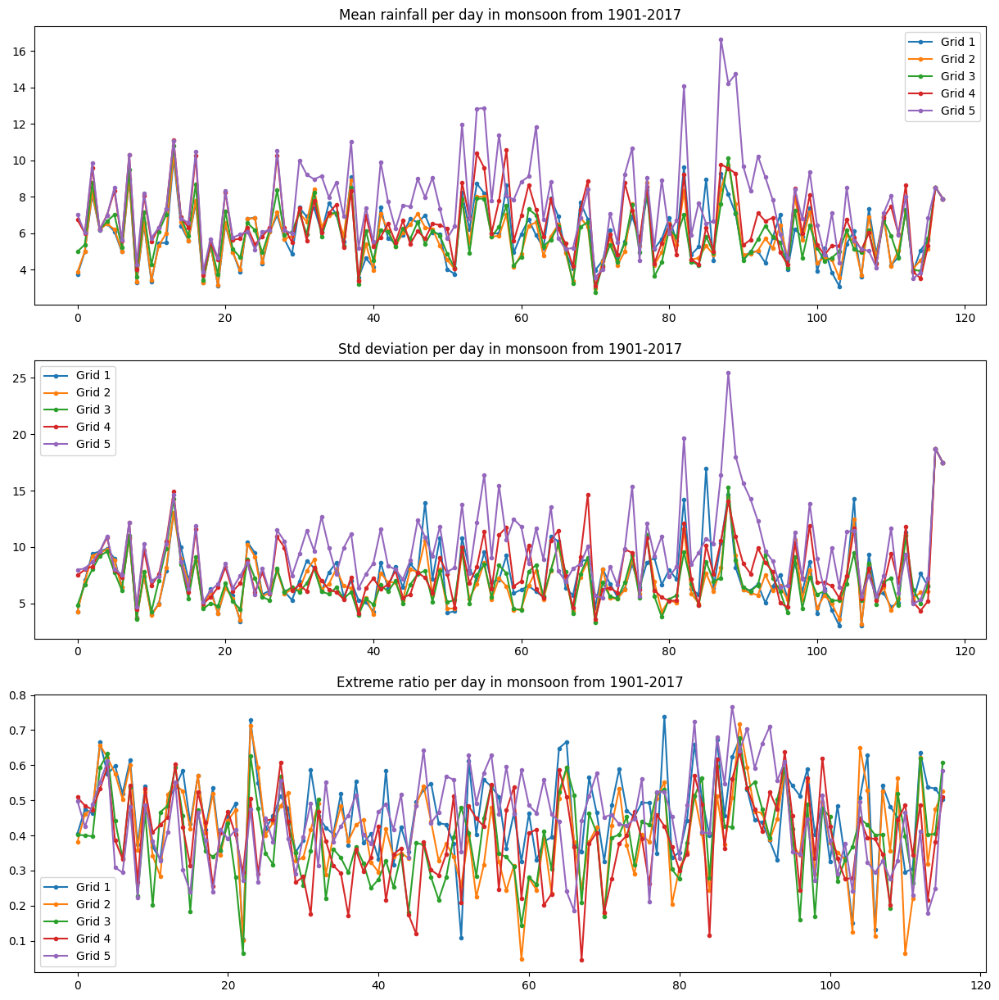

In [ ]:
rainfall_5_grids(0*365,117*365,18.5,79.25)

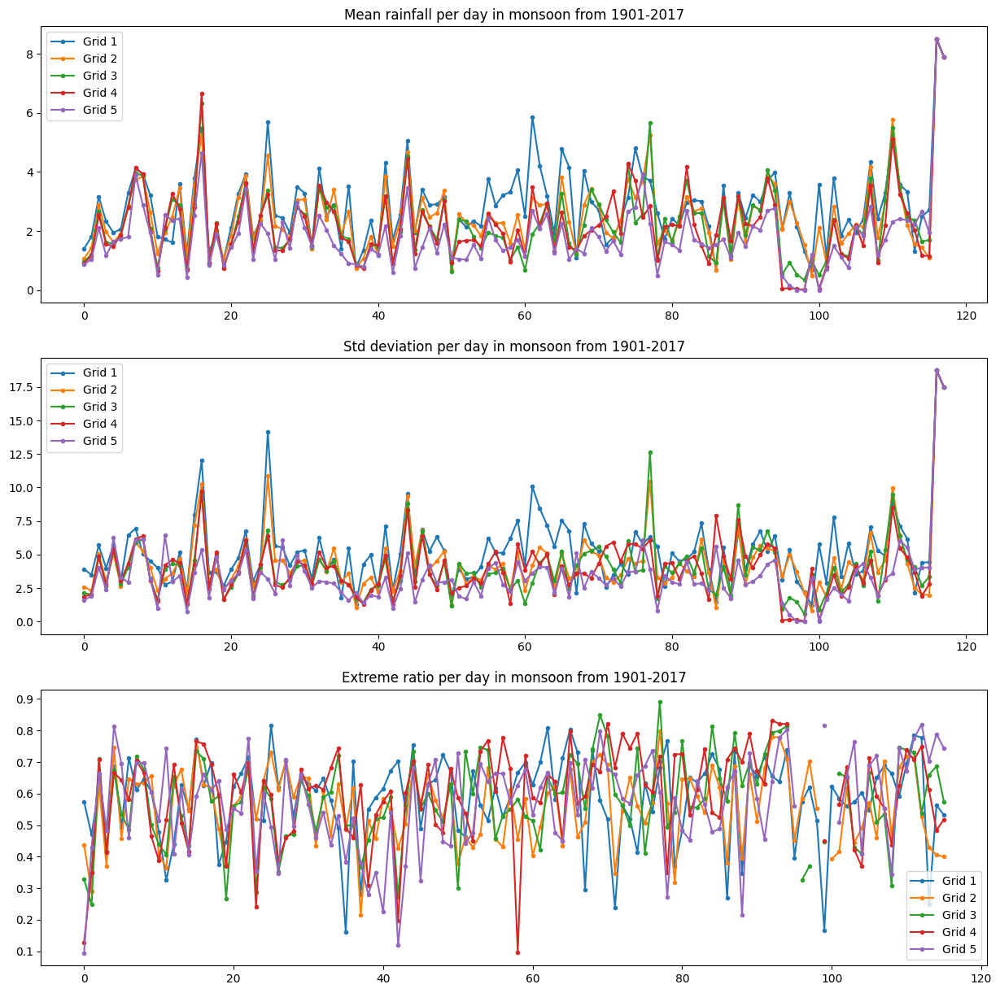

In [ ]:
rainfall_5_grids(0*365,117*365,29.14,75.72)

# **STUDY IN NORTH EAST REGION**
finding abnormal patterns in rainfall after 1970

/usr/local/lib/python3.10/dist-packages/numpy/core/shape_base.py:65: UserWarning: Warning: converting a masked element to nan.
  ary = asanyarray(ary)


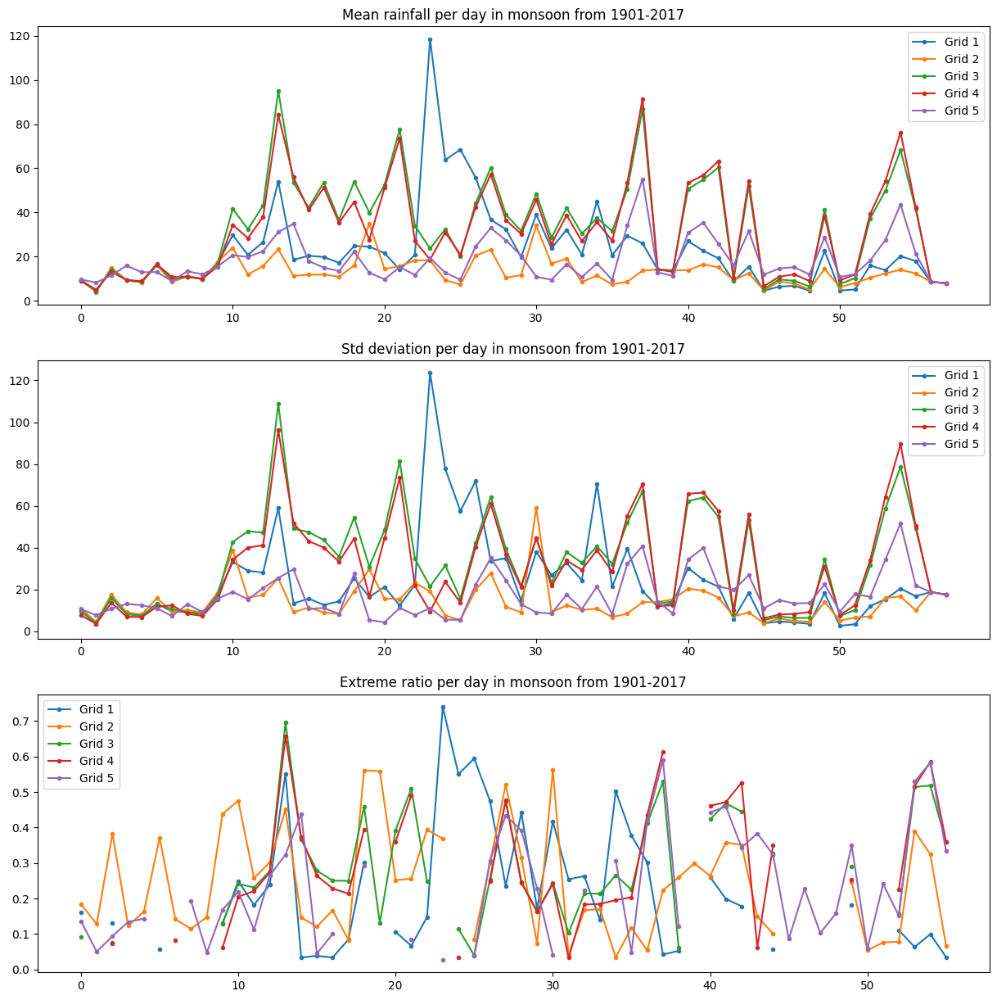

In [ ]:
rainfall_5_grids(60*365,117*365,25.5,92)

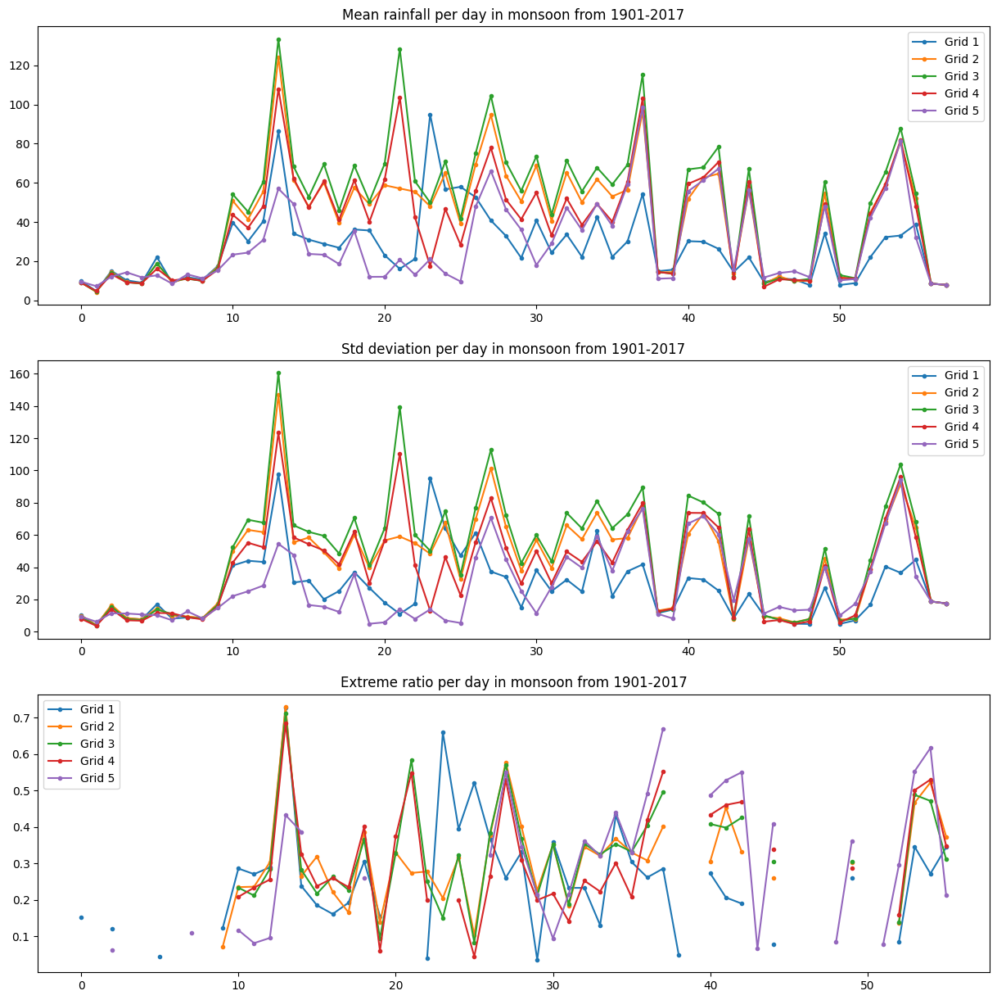

In [ ]:
rainfall_5_grids(60*365,117*365,25.25,92)

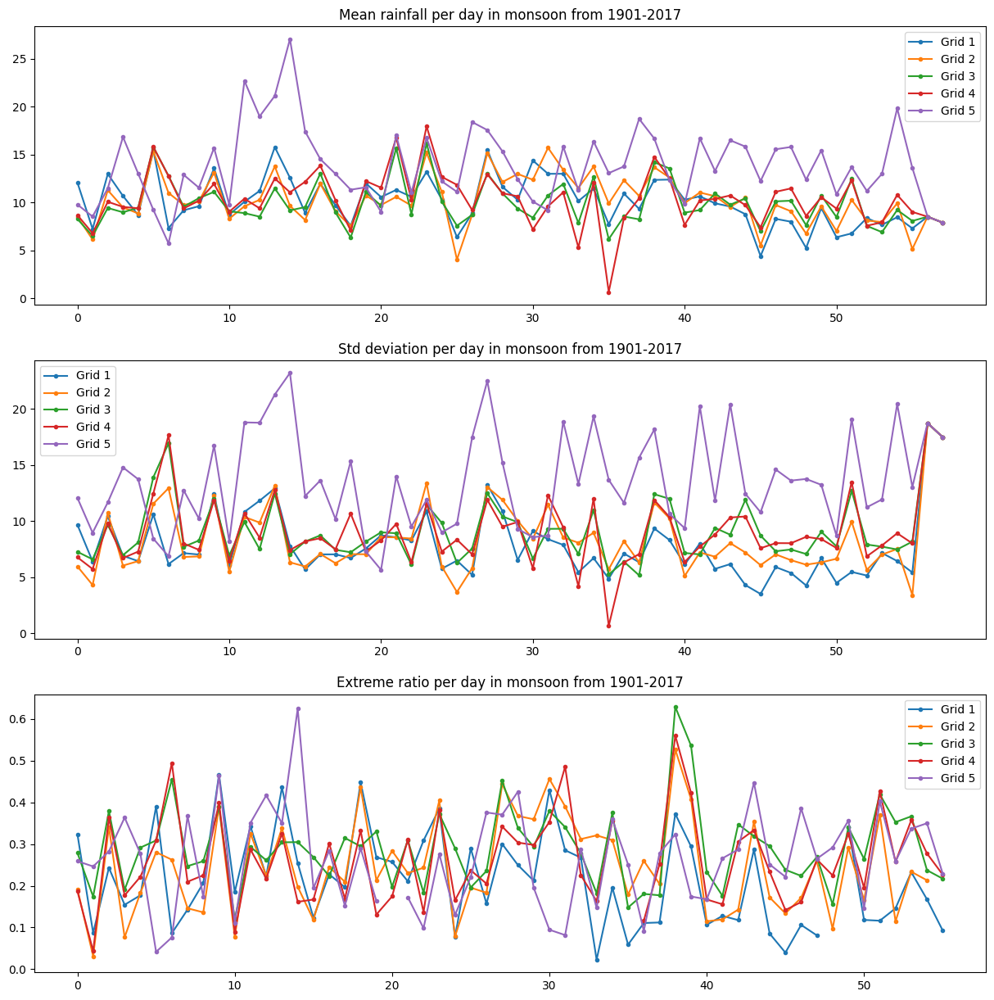

In [ ]:
rainfall_5_grids(60*365,117*365,26,92)

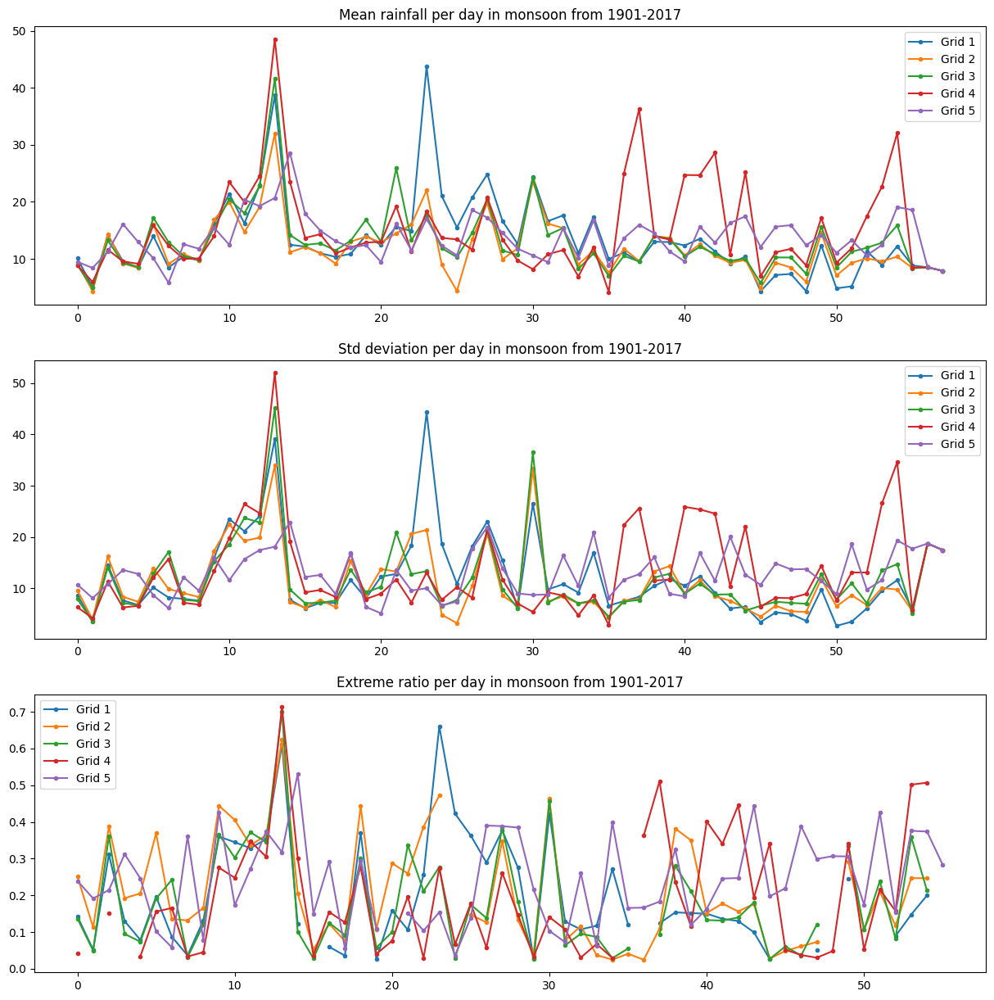

In [ ]:
rainfall_5_grids(60*365,117*365,25.75,92)


# **NORTH WHEAT BURN**
1. HARYANA = (29.0588° N, 76.0856° E) 
2. UP = (27.5706° N, 80.0982° E)
3. PUNJAB = (31.1471° N, 75.3412° E)

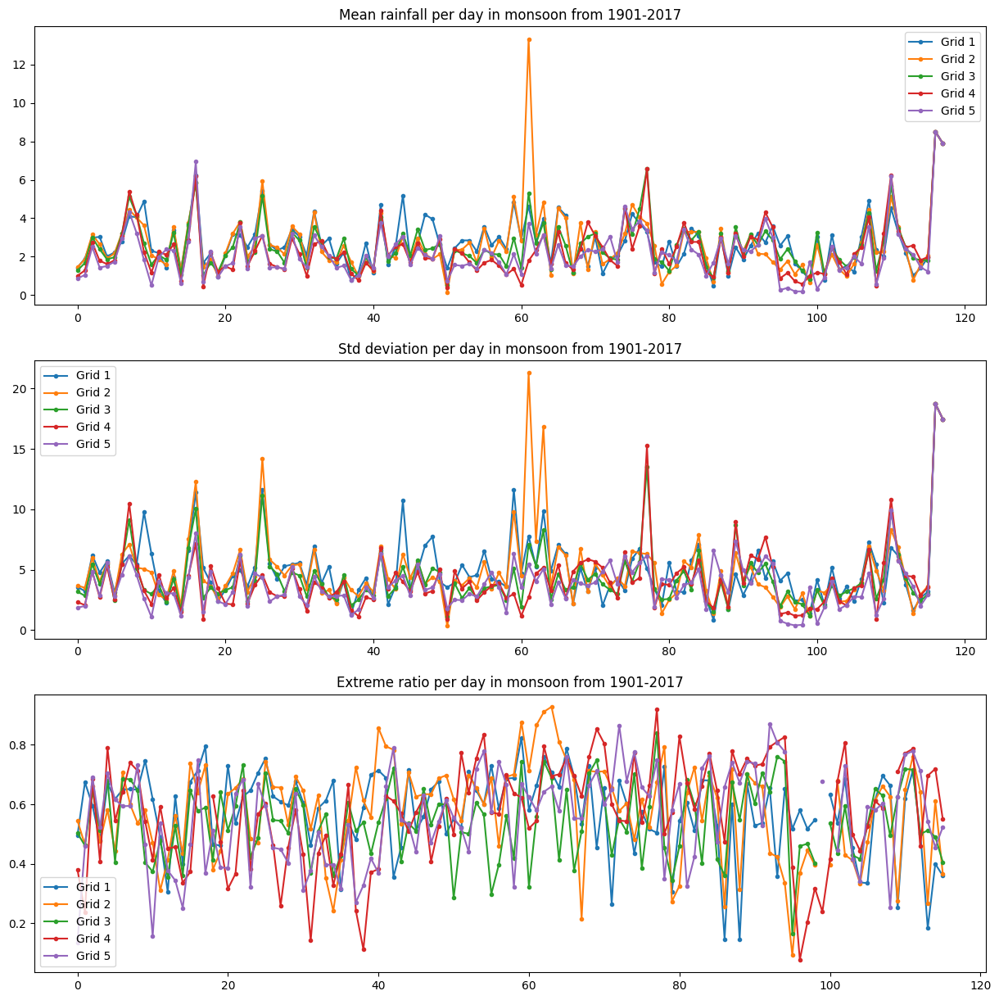

In [ ]:
rainfall_5_grids(0*365,117*365,29,76)

**Comparision between 2 places using Reference**

In [ ]:
# Example comparison of 2 different grids

def comparision(a,b,x,y,x1,y1) :
  grid1 = extremum_ratio(a,b,x,y)
  grid2 = extremum_ratio(a,b,x1,y1)


  fig, axs = plt.subplots(3, figsize=(15,15))
  axs[0].plot(grid1[0],marker='.', label='Grid 1')
  axs[0].plot(grid2[0],marker='.', label='Grid 2')
  axs[0].set_title('Mean rainfall per day in monsoon from 1901-2017(Comparision with respect to reference)')
  axs[0].legend()
  print("")

  axs[1].plot(grid1[1],marker='.', label='Grid 1')
  axs[1].plot(grid2[1],marker='.', label='Grid 2')
  axs[1].set_title('Std deviation per day in monsoon from 1901-2017(Comparision with respect to reference)')
  axs[1].legend()
  print("")

  axs[2].plot(grid1[2],marker='.', label='Grid 1')
  axs[2].plot(grid2[2],marker='.', label='Grid 2')
  axs[2].set_title('Extreme ratio per day in monsoon from 1901-2017(Comparision with respect to reference)')
  axs[2].legend()

# **STUDY ON COAL PLANTS**
1.   RAICHUR commision 1986
2.   SASAN commision 2015
4. SIPAT commision 2008
5. RAMAGUNDAM commision 1983

Dharwad vs Raichur

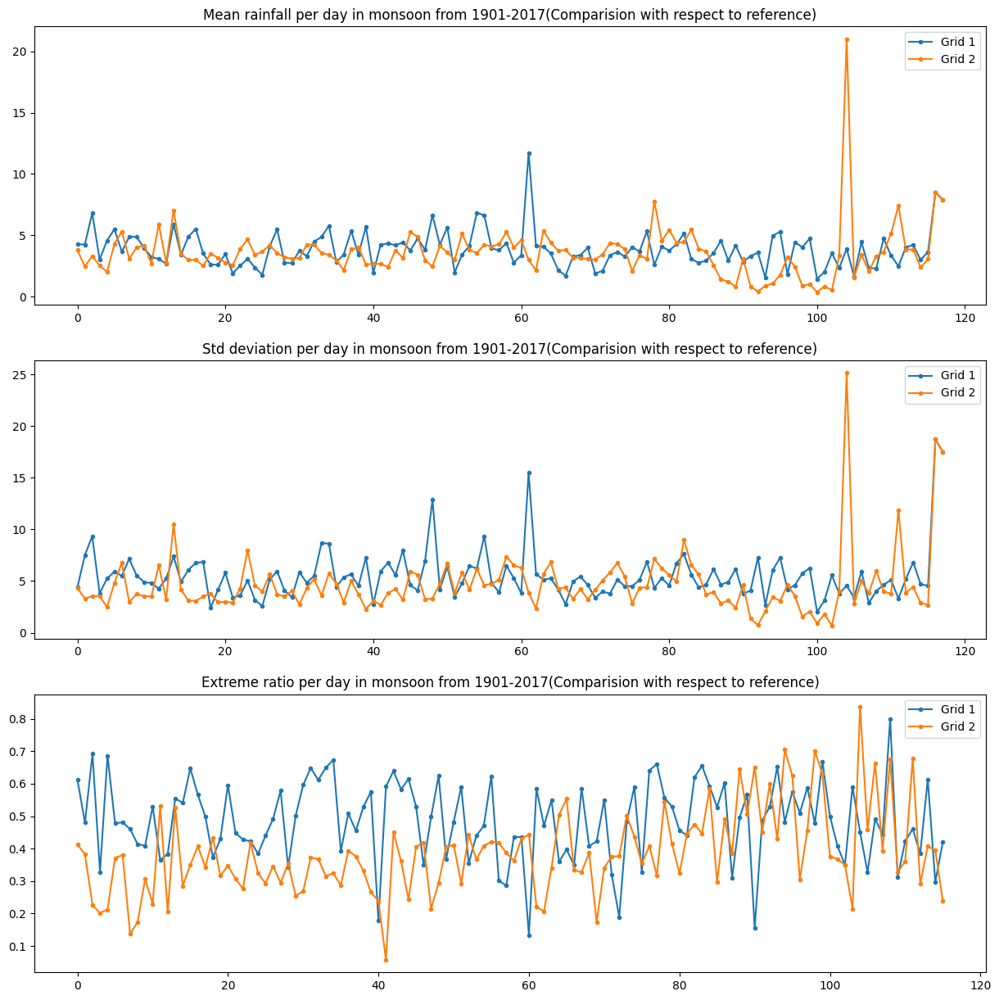

In [ ]:
comparision(1,117*365,16.21,77.35,15.45,75.07)

Dharwad vs Bengalore

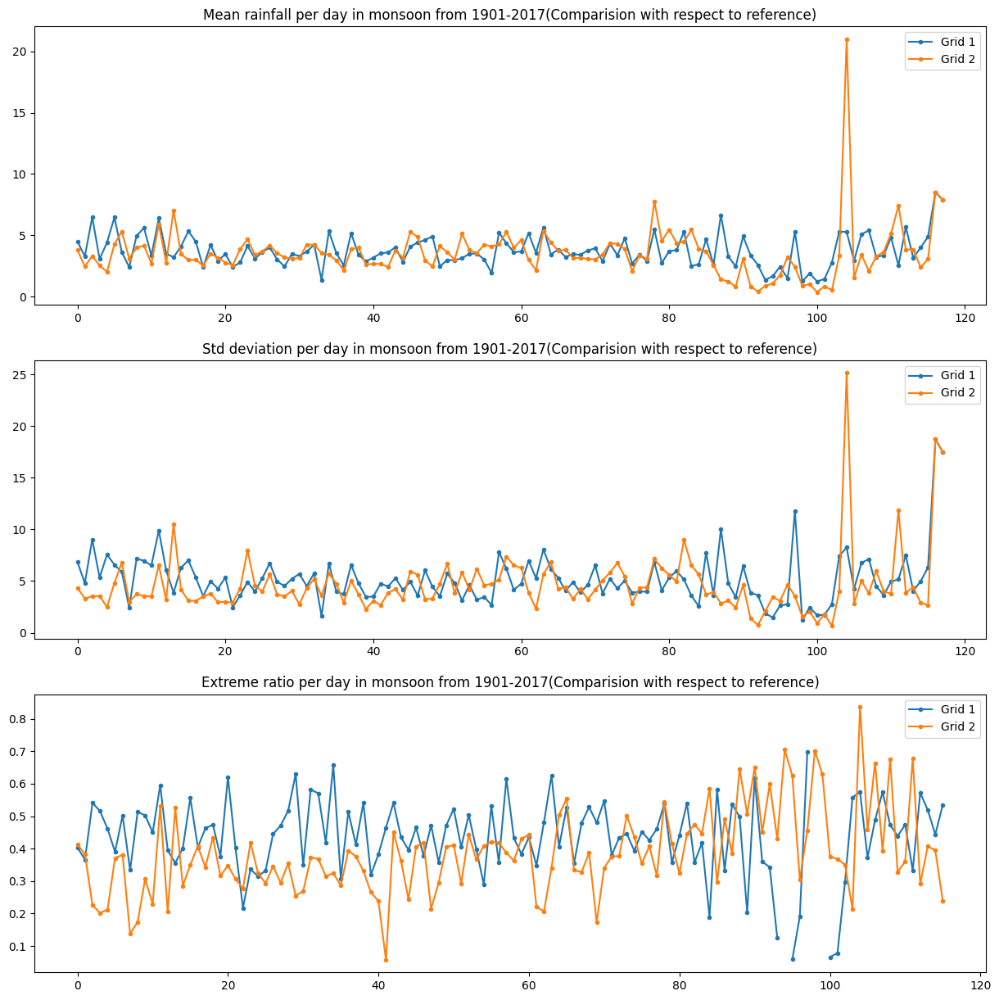

In [ ]:
comparision(1,117*365,12.97,77.59,15.45,75.07)

Delhi vs Bangalore

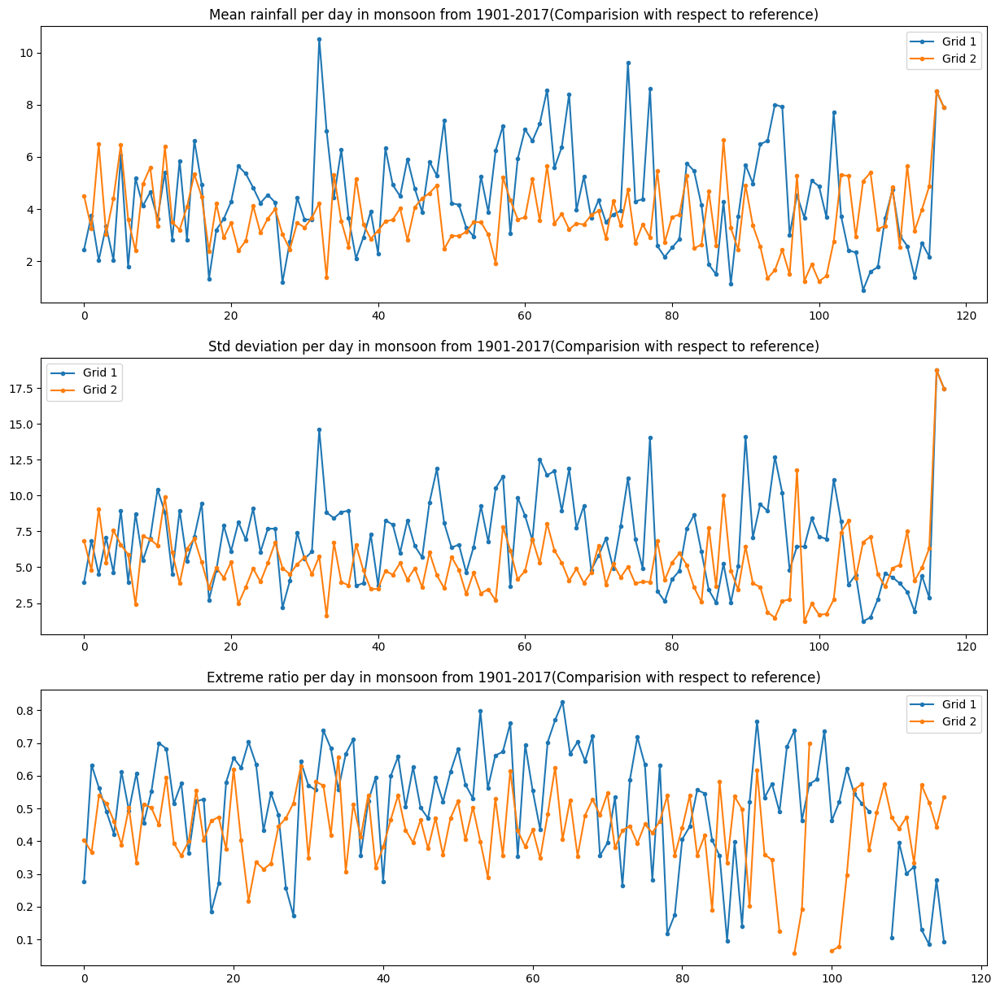

In [ ]:
comparision(1,117*365,28.64,77.21,12.97,77.59)

Chirapunjee vs Guwahati

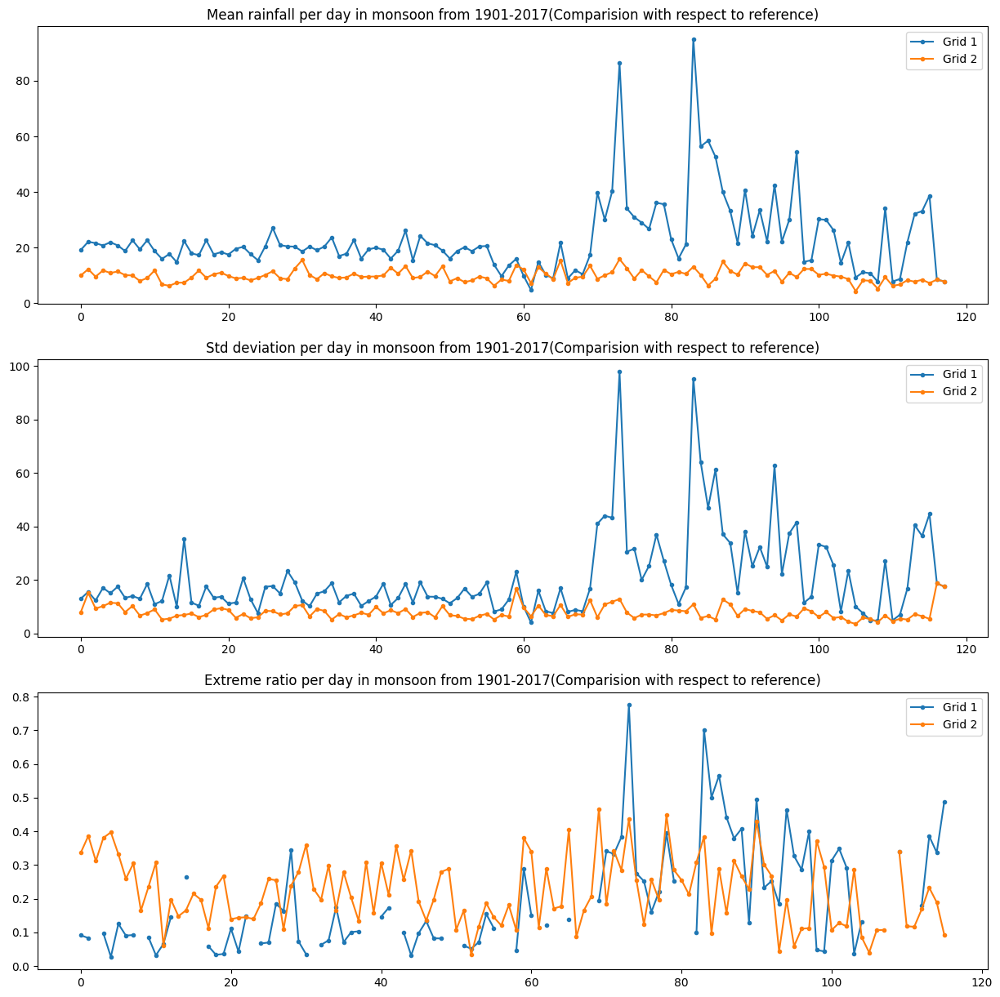

In [ ]:
comparision(1,117*365,25.21,91.73,26.11,91.70)

Bathinda vs Delhi

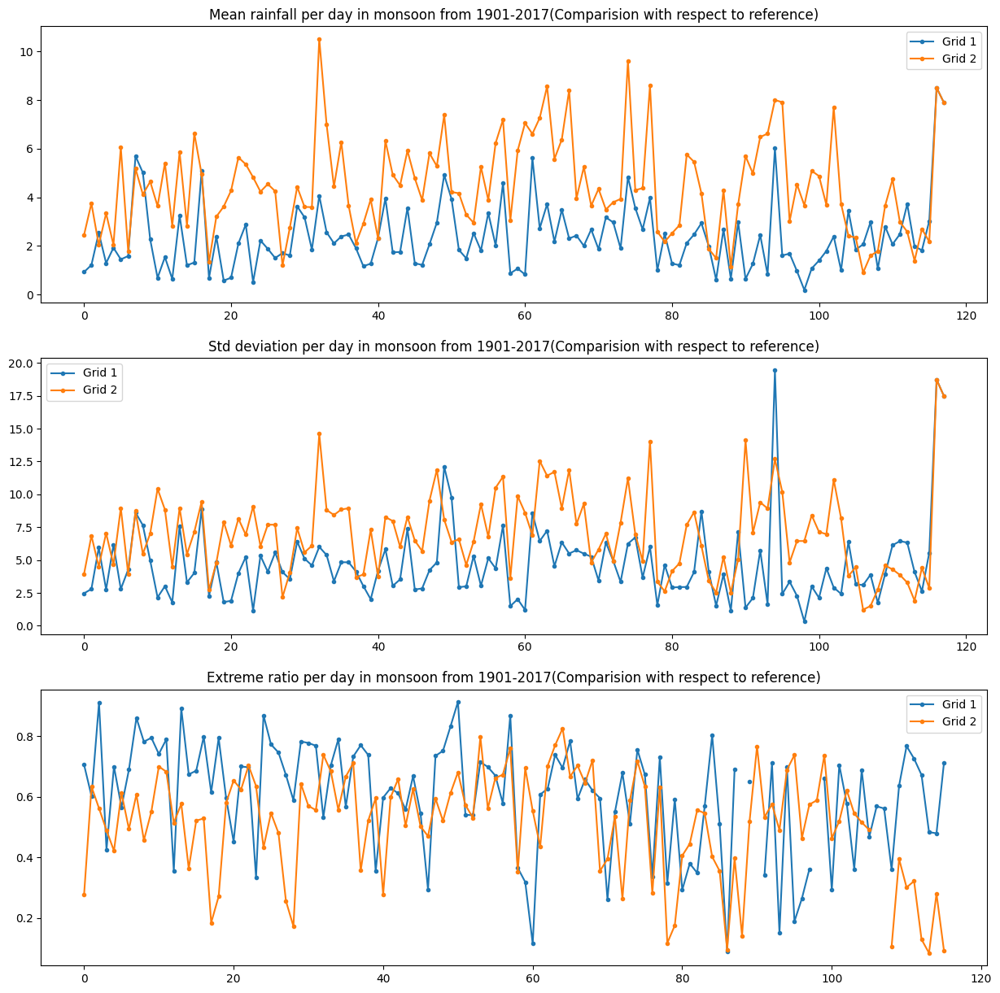

In [ ]:
comparision(1,117*365,30.21,74.94,28.64,77.21)

**FINDING THE MONSOON PERIOD**

In [ ]:
def rollingMeanRainfall_monsoon(a,b,y,x) :
  lon_idx = np.abs(lons - x).argmin()
  lat_idx = np.abs(lats - y).argmin()
  rainfall_at_loc = rain[a:b,:, lat_idx, lon_idx]
  arr = rainfall_at_loc.reshape(b-a)
  avg=[]
  i = 0
  k=20
  while i < len(arr) - k:
      window_average = np.sum(arr[i:i+k]) / k
      avg.append(window_average)
      i += 1
  roll_mean = avg
  i=0
  for i in range(int(len(roll_mean)/365)+1):
    roll_mean1=roll_mean[i*365:(i+1)*365]
    monsoon_array = np.where(roll_mean1 > 1.5*np.mean(roll_mean1))[0] 
    diff = np.diff(monsoon_array)
    diff = np.concatenate([diff, [np.inf]])
    indices = np.where(diff > 40)[0]
    re_mon_arr = monsoon_array[:indices[0]+1]
    print(re_mon_arr[0]+10,re_mon_arr[-1]-10)
  plt.plot(arr,marker='.')
  plt.gcf().set_size_inches(17, 6) 
  plt.xticks(np.arange(0, len(avg), len(avg)/15))
  plt.title('Rolling mean of rainfall')
  plt.show()
  print("")
  plt.plot(avg,marker='.')
  plt.gcf().set_size_inches(17, 6) 
  plt.xticks(np.arange(0, len(avg), len(avg)/15))
  plt.axhline(y=np.mean(avg))
  plt.title('Rolling mean of rainfall')
  plt.show()
  print("")

Example of Delhi monsoon

10 -10
162 240
190 244
58 52
13 11
171 248
42 27
183 231
104 243
179 266
10 -6
193 243
49 44
179 254
28 62
191 261
181 257
86 74
24 23
170 207
196 260
194 255
50 39
199 282
165 213
189 237
185 225
30 29
181 230
29 10
195 268
196 264
173 259
177 233
45 26
172 247
42 41
14 23
53 52
32 31
17 16
183 249
189 247
94 86
189 268
181 241
204 268
202 243
193 263
192 261
95 93
184 240
174 225
54 53
193 280
197 286
203 260
206 275
33 24
194 282
193 239
137 268
172 263
194 274
206 253
180 228
191 261
187 230
203 259
164 261
147 143
197 231
194 256
193 224
188 265
177 240
186 261
189 253
59 58
192 255
190 280
85 69
116 115
196 254
198 228
53 38
132 170
193 277
19 18
71 55
215 255
218 265
201 266
193 248
213 260
189 265
178 253
195 279
21 16
56 48
165 240
163 271
194 258
137 128
55 52
194 261
59 85
159 268
199 269
211 280
194 268
210 276
54 53
77 62
79 78
201 261
189 283


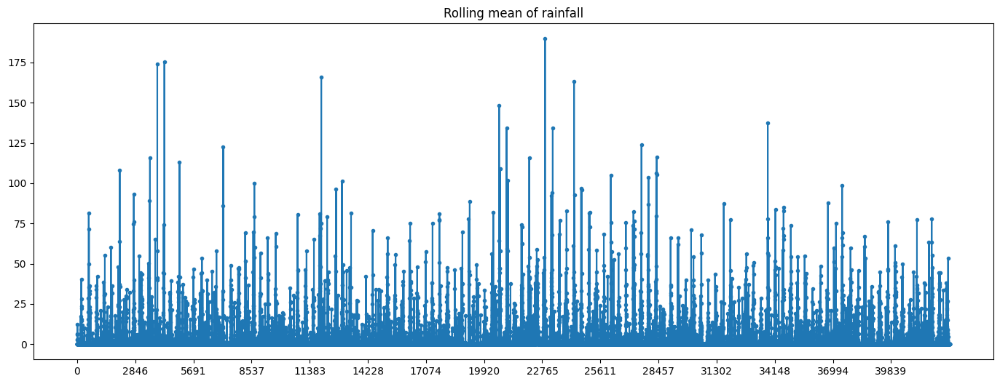

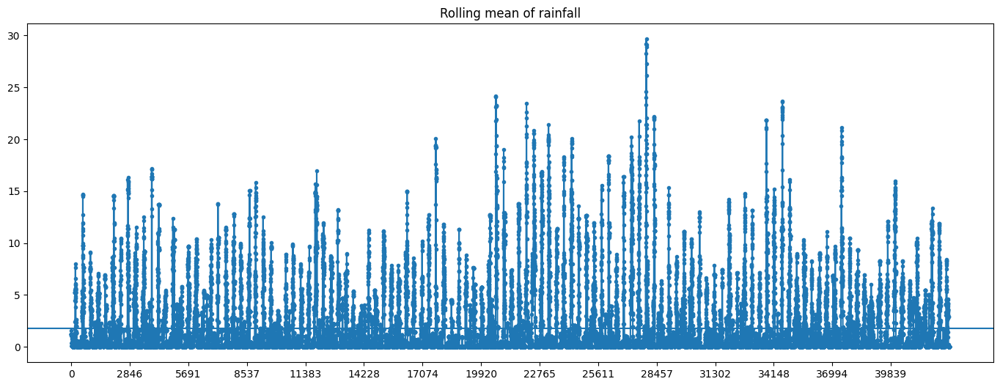

In [ ]:
 rollingMeanRainfall_monsoon(0*365,117*365,28.70,77.10)

# **CODE FOR BEST FIT QUADRATIC CURVE**

In [ ]:
def fit_rainfall_curve(lon,lat):
    lon_idx = np.abs(lons - lon).argmin()
    lat_idx = np.abs(lats - lat).argmin()
    rainfall_at_loc = rain[:(117*365), :, lat_idx, lon_idx]
    arr = rainfall_at_loc.reshape(-1)
    year_idx = np.arange(1961, 2017) - 1985
    f = []
    for year in range(1961, 2017):
        rainfall_year = arr[(year-1961+60)*365:(year-1960+60)*365]
        extreme_rainfall = np.sum(rainfall_year > 1.5*np.mean(rainfall_year))
        total_rainfall = np.sum(rainfall_year)
        f.append(extreme_rainfall/total_rainfall)
    f = np.array(f)
    f[f > 0.7] = np.nan # Remove cyclone affected points
    f_scaled = (f - np.mean(f))/np.std(f)
    X = np.vstack([year_idx**2, year_idx, np.ones(len(year_idx))]).T
    a, b, c = np.linalg.lstsq(X, f_scaled, rcond=None)[0]
    f_fit = a*year_idx**2 + b*year_idx + c
    errors = np.sqrt(np.diag(np.linalg.inv(X.T @ X)))
    print(f'Best fit: f = {a:.3f} x^2 + {b:.3f} x + {c:.3f}')
    print(f'Errors in a, b, c: {errors}')
    plt.plot(year_idx, f, '.', label='Data')
    plt.plot(year_idx, f_fit, label='Best fit')
    plt.xlabel('Julian Year')
    plt.title('Best Fit Quadratic Curve for Extremum/Total Rainfall Ratio')
    plt.ylabel('Extreme/Total Rainfall')
    plt.legend()
    plt.show()


PLOT OF BEST SQUARE FIT AND ITS COEFFICIENTS

Best fit: f = -0.000 x^2 + 0.002 x + 0.052
Errors in a, b, c: [0.00057 0.00919 0.19746]


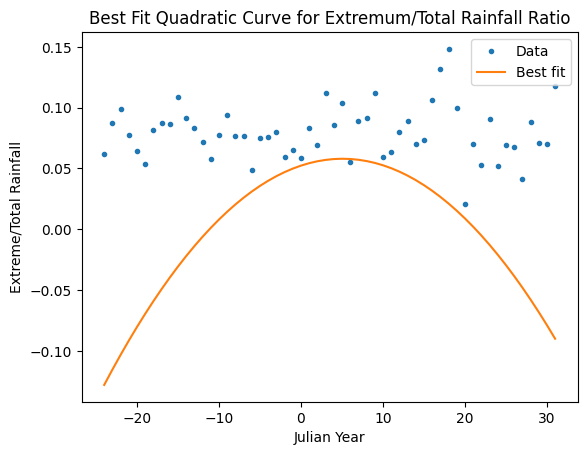

In [ ]:
fit_rainfall_curve(75, 15.4)


# ** CHI-SQUARE FIT FOR RAINFALL **

In [ ]:
from scipy import stats
def chi_square_fit( lat,lon):
  lon_idx = np.abs(lons - lon).argmin()
  lat_idx = np.abs(lats - lat).argmin()

  rainfall_at_loc = rain[:(117*365), :, lat_idx, lon_idx]   
  arr = rainfall_at_loc.reshape(-1)

  julian_years = np.arange(1961, 2017) - 1985   #julian years

  f = []
  for year in range(1961, 2017):
      year1=year+60
      rainfall_year = arr[(year1-1961)*365:(year1-1960)*365]
      extreme_rainfall = np.sum(rainfall_year > 1.5*np.mean(rainfall_year))
      total_rainfall = np.sum(rainfall_year)
      f.append(extreme_rainfall/total_rainfall)
  f = np.array(f)
  
  # Fit a chi-square distribution to the data
  if len(julian_years) != len(f):
      raise ValueError("julian_years and rainfall_ratio must have the same size")

  # Fit a chi-square distribution to the data using Maximum Likelihood Estimation (MLE)
  params = stats.chi2.fit(f)

  # Generate y-values for the chi-square distribution (ranging from 0 to 1)
  y = np.linspace(0, 1, 100)

  # Plot the scatter plot of the data
  plt.scatter(julian_years, f, label='Observed Data')

  # Plot the chi-square fit curve
  plt.plot(julian_years, stats.chi2.cdf(f, *params), 'r-', label='Chi-square Fit')

  plt.xlabel('Julian Year')
  plt.ylabel('Extremum/Total Rainfall Ratio')
  plt.title('Chi-square Fit for Extremum/Total Rainfall Ratio')
  plt.legend()
  plt.show()

  print(f)

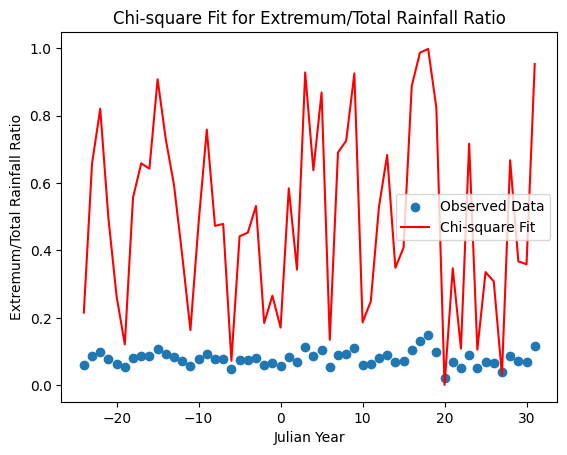

[0.06161 0.08718 0.09904 0.07793 0.06475 0.05401 0.08132 0.08726 0.08629 0.10896 0.09188 0.08344 0.07192 0.05774 0.07718 0.09399 0.07669 0.07701 0.04851 0.07501 0.07561 0.07993 0.05937 0.0649  0.05834 0.08288 0.06951 0.11227 0.08602 0.1039  0.05529 0.08929 0.09162 0.11175 0.05952 0.06382 0.0798  0.08882 0.06984 0.07318 0.10628 0.13158 0.14825 0.09931 0.02108 0.06975 0.05275 0.09102 0.05242 0.0691  0.0675  0.04097 0.08783 0.07091 0.07042 0.11758]


In [ ]:
chi_square_fit(15.4,75)  #dharwad

#Table Of Extremums

In [ ]:
import numpy as np 

def rollingMeanRainfall_func_2(a,b,y,x) :
  lon_idx = np.abs(lons - x).argmin()
  lat_idx = np.abs(lats - y).argmin()
  rainfall_at_loc = rain[a:b,:, lat_idx, lon_idx]
  arr = rainfall_at_loc.reshape(b-a)
  avg=[]
  i = 0
  k=3
  while i < len(arr) - k:
      window_average = np.sum(arr[i:i+k]) / k
      avg.append(window_average)
      i += 1

  m = np.mean(avg)
  p=np.std(avg)
  thr=m+4*p
  mean_every_year = []
  std_every_year = []
  ratio_every_year = []
  extreme_ratio = []
  idx = np.where(arr > thr)[0]
  extremum = arr[idx]

  for i in range(int(len(avg)/365)):
    start = i*365 + 1  
    end = (i+1)*365  
    new_array = extremum[np.where((idx >= start) & (idx <= end))[0]]  
    sum_ex = np.sum(new_array)
    base_arr = avg[i*365+160:i*365+280]
    base_arr1 = avg[i*365:(i+1)*365]
    sum = np.sum(base_arr1)
    me = np.mean(base_arr)
    ratio = sum_ex/sum
    extreme_ratio.append(ratio)
    st = np.std(base_arr)
    ratio_every_year.append(sum)
    mean_every_year.append(me)
    std_every_year.append(st)

  base_arr2019=rain2019[180:280]
  me2019= np.mean(base_arr2019)
  st2019= np.std(base_arr2019)
  mean_every_year.append(me2019)
  std_every_year.append(st2019)

  base_arr2020=rain2020[180:280]
  me2020= np.mean(base_arr2020)
  st2020= np.std(base_arr2020)
  mean_every_year.append(me2020)
  std_every_year.append(st2020)


  np.set_printoptions(threshold=np.inf, linewidth=np.inf)
  np.set_printoptions(precision=5, suppress=True)
  print(np.column_stack((idx,extremum)))

In [ ]:
rollingMeanRainfall_func_2(1,117*365,15.46,75.07)

[[  117.         47.77517]
 [  121.         45.67206]
 [  133.         24.80395]
 [  150.         30.20588]
 [  163.         27.59102]
 [  257.         29.36478]
 [  259.         27.28887]
 [  274.         21.59138]
 [  277.         37.04279]
 [  294.         22.4214 ]
 [  485.         24.4529 ]
 [  514.         29.55989]
 [  527.         22.86459]
 [  528.         22.37971]
 [  651.         26.32119]
 [  673.         31.81967]
 [  703.         50.24892]
 [  704.         59.34716]
 [  970.         22.72262]
 [  989.         31.91886]
 [ 1002.         24.22164]
 [ 1020.         44.01096]
 [ 1063.         26.10021]
 [ 1232.         25.58594]
 [ 1238.         26.58165]
 [ 1239.         22.94407]
 [ 1275.         22.85123]
 [ 1279.         24.05864]
 [ 1621.         47.35138]
 [ 1733.         25.64786]
 [ 1743.         30.28505]
 [ 1981.         26.90935]
 [ 2028.         24.84883]
 [ 2053.         45.87641]
 [ 2055.         27.59235]
 [ 2092.         41.95203]
 [ 2108.         25.82516]
 